# Fine-Tuning a pretrained ViT for pneumonia prediction

The basic idea of the Vision Transformer (ViT) is to treat image patches the same way as tokens (words). The initial paper (Dosovitskiy et al., 2021) showed that, with sufficient amounts of data for pretraining (the paper uses 14M-300M images), the model may surpass CNN-based paradigms in image classification. Here, I first want to implement the ViT from scratch, then load pretrained weights and use the pretrained ViT for a classification task in which the goal is to detect whether children suffer from pneumonia given an X-Ray image of their lungs. Lastly, I will also visualize the attention on the X-Ray images for explainability.

For this endeavor, the agenda looks as follows:

1. Data exploration
2. Setting up dataset and dataloader
3. Building ViT from scratch
4. Loading pretrained weights and fine-tuning the ViT
5. Visualizing attention

In [3]:
#Let's first make some imports of all the libraries that we will use in this project
import os
import numpy as np
from einops.layers.torch import Rearrange
import torch
from torch import nn, optim, Tensor
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision.io import read_image, ImageReadMode
from torchvision.transforms import Compose, Resize, ToTensor
from torchvision.transforms.functional import to_pil_image
from torcheval.metrics import BinaryAccuracy
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score
import timm
import wandb
from tqdm import tqdm
from typing import Optional, Callable, Tuple, List
from PIL import Image
sns.set_theme()

SEED = 42
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

c:\Users\s_gue\anaconda3\envs\ml_basics\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
#Ensure reproducibility
def seed_everything(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

seed_everything(SEED)

# 1. Data exploration

For this script, I have decided to use a dataset of Chest X-Ray Images for which we should classify whether the patient suffers from pneumonia or not. The dataset is freely available [here](https://data.mendeley.com/datasets/rscbjbr9sj/2) by Kermany et al. (2018). After downloading the data, unpack the dataset and place it in "./datasets/chest_xray". 

This is what the directory structure should look like:

```
/Generative_AI/ViT_for_pneumonia.ipynb
/datasets 
┣ 📂 chest_xray
┃   ┣ 📂 train
┃   ┃   ┣ 📂 NORMAL
┃   ┃   ┣ 📂 PNEUMONIA
┃   ┣ 📂 test
┃   ┃   ┣ 📂 NORMAL
┃   ┃   ┣ 📂 PNEUMONIA
```

We will first check for things like:
- nan values in the data
- unequal class distributions (e.g. having more patient than healthy data)

In [4]:
#Let's check how many samples we have in each class for training and testing
splits = ['train', 'test']
categories = ['NORMAL', 'PNEUMONIA']
data = {}

for split in splits:
    data[split] = [len(os.listdir(f'../datasets/chest_xray/{split}/{category}')) for category in categories]

print(data)

{'train': [1349, 3883], 'test': [234, 390]}


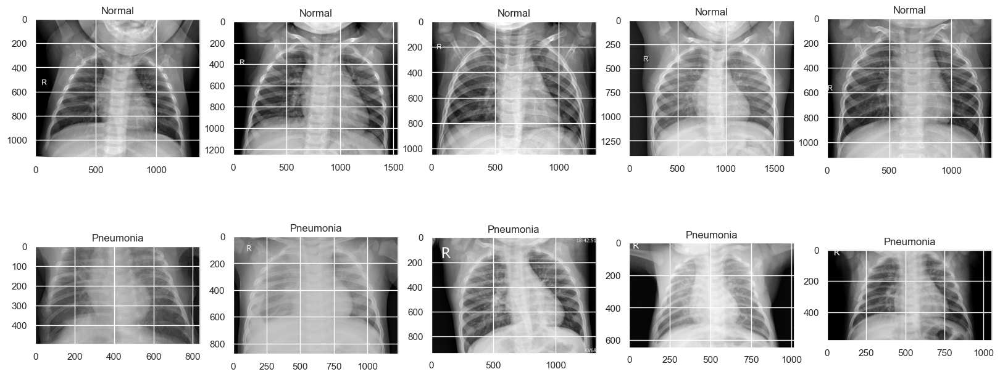

Minimum pixel value: 0
Maximum pixel value: 255


In [5]:
#Let's visualize 5 random normal vs 5 pneumonia images
norm_idxs = np.random.choice(data["train"][0], 5, replace=False)
pneu_idxs = np.random.choice(data["train"][1], 5, replace=False)

norm_list = os.listdir('../datasets/chest_xray/train/NORMAL')
pneu_list = os.listdir('../datasets/chest_xray/train/PNEUMONIA')

plt.figure(figsize=(20,8))
idx_count = 1
for idx in norm_idxs:
    plt.subplot(2,5,idx_count) #n_rows, n_columns, index
    img = plt.imread('../datasets/chest_xray/train/NORMAL/' + norm_list[idx])
    plt.imshow(img, cmap='gray')
    plt.title('Normal')
    idx_count += 1

for idx in pneu_idxs:
    plt.subplot(2,5,idx_count)
    img = plt.imread('../datasets/chest_xray/train/PNEUMONIA/' + pneu_list[idx])
    plt.imshow(img, cmap='gray')
    plt.title('Pneumonia')
    idx_count += 1

plt.show()

print(f"Minimum pixel value: {np.min(img)}")
print(f"Maximum pixel value: {np.max(img)}")

Notice that the grayscale images have different sizes. We will transform them into the same size [224, 224], which is what the ViT will expect. As a positive side effect that also means we can stack all images into one tensor.

Additionally, we can see that the pixel values lie between [0, 255]. For better convergence and to improve numerical stability, we will normalize the data input range to [-1, 1]. 

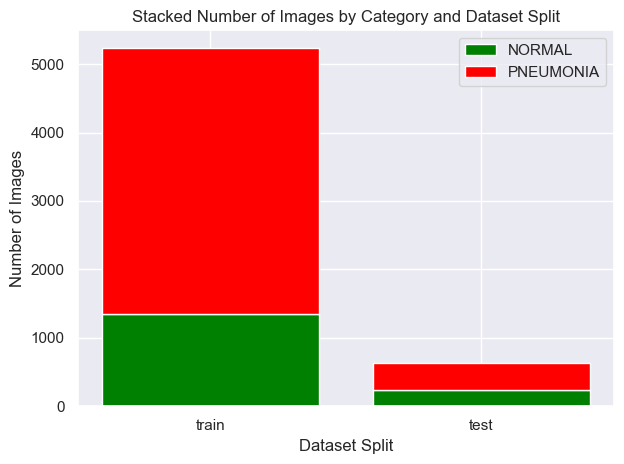

In [5]:
#Plot stacked bars
colors = ["green", "red"]
fig, ax = plt.subplots()
for i, split in enumerate(splits):
    bottom = 0  # The starting point for the stacked bars
    for j, category in enumerate(categories):
        ax.bar(split, data[split][j], bottom=bottom, label=category if i == 0 else "", color=colors[j])
        bottom += data[split][j]

# Adding some text for labels, title, and axes ticks
ax.set_xlabel('Dataset Split')
ax.set_ylabel('Number of Images')
ax.set_title('Stacked Number of Images by Category and Dataset Split')
ax.legend()

plt.tight_layout()
plt.show()

Note that we have $\frac{3884}{1349}=2.88$ more PNEUMONIA than NORMAL samples in the training data. Class imbalance is mainly treated in 3 different ways:
- Random under-sampling of majority class
- Random over-sampling of minority class
- Data augmentation

In [6]:
class NormalizeImage(torch.nn.Module):
    """
    Normalizes the image to be in the range [-1, 1].
    """
    def __init__(self):
        super().__init__()

    def forward(self, image):
        return image / 255 * 2.0 - 1.0


def preprocess_image(transforms, split="train", seed=42):
    """
    Preprocesses images, splits train into train/val, and saves as tensors.

    Args:
        transforms: A torchvision.transforms.Compose object with transformations.
        split: 'train' or 'test' dataset.
        seed: Random seed for reproducibility.
    """

    assert split in ["train", "test"], "split must be either 'train' or 'test'"
    image_path = f'./datasets/chest_xray/{split}/'

    #Organize image paths by condition (NORMAL, PNEUMONIA)
    image_paths = {
        "NORMAL":  os.listdir(image_path + 'NORMAL'),
        "PNEUMONIA": os.listdir(image_path + 'PNEUMONIA')
    }

    if split == "train":
        train_paths, val_paths = {}, {}
        for condition, paths in image_paths.items():
            train_paths[condition], val_paths[condition] = train_test_split(paths, test_size=0.15, random_state=seed)

        #Preprocess and store train data
        images_train = [transforms(read_image(path=os.path.join(image_path, condition, path), mode=ImageReadMode.GRAY))
                        for condition, paths in train_paths.items() for path in paths]
        out_train = torch.stack(images_train)
        labels_train = torch.cat([torch.zeros(len(train_paths['NORMAL'])), 
                                  torch.ones(len(train_paths['PNEUMONIA']))])

        #Preprocess and store validation data 
        images_val = [transforms(read_image(path=os.path.join(image_path, condition, path), mode=ImageReadMode.GRAY))
                      for condition, paths in val_paths.items() for path in paths]
        out_val = torch.stack(images_val)
        labels_val = torch.cat([torch.zeros(len(val_paths['NORMAL'])), 
                                torch.ones(len(val_paths['PNEUMONIA']))])

        #Save train/val data and labels
        torch.save(out_train, f'../datasets/chest_xray/train_data.pt')
        torch.save(labels_train, f'../datasets/chest_xray/train_labels.pt')
        torch.save(out_val, f'../datasets/chest_xray/val_data.pt')
        torch.save(labels_val, f'../datasets/chest_xray/val_labels.pt')

        #Sanity Checks
        print(f"Train data shape: {out_train.shape}")
        print(f"Train labels shape: {labels_train.shape}")
        print(f"Val data shape: {out_val.shape}")
        print(f"Val labels shape: {labels_val.shape}")

    else:  #Test set
        images = [transforms(read_image(path=os.path.join(image_path, condition, path), mode=ImageReadMode.GRAY))
                  for condition, paths in image_paths.items() for path in paths]
        out = torch.stack(images)
        labels = torch.cat([torch.zeros(len(image_paths['NORMAL'])), 
                            torch.ones(len(image_paths['PNEUMONIA']))])

        #Save test data and labels
        torch.save(out, f'../datasets/chest_xray/test_data.pt')
        torch.save(labels, f'../datasets/chest_xray/test_labels.pt')

        #Sanity Checks
        print(f"Test data shape: {out.shape}")
        print(f"Test labels shape: {labels.shape}")
    


transforms = Compose([
    NormalizeImage(),
    Resize((224, 224)),
    ])

preprocess_image(transforms, split="train")
preprocess_image(transforms, split="test")

c:\Users\s_gue\anaconda3\envs\ml_basics\Lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Train data shape: torch.Size([4446, 1, 224, 224])
Train labels shape: torch.Size([4446])
Val data shape: torch.Size([786, 1, 224, 224])
Val labels shape: torch.Size([786])
Test data shape: torch.Size([624, 1, 224, 224])
Test labels shape: torch.Size([624])


# 2. Setting up dataset and dataloader

To take care of the class imbalance we calculate a weight for each sample that depends on the frequency of its class. These weights are passed to the WeightedRandomSampler, leading to oversampling of the minority class and undersampling of the majority class.
Therefore, in one epoch the model might not see all samples, but as we randomly select new ones each epoch, our model will see most samples during training.

In [6]:
class XRay_Dataset(Dataset):
    """
    Loads data and labels of 'split' to be used in DataLoader.
    """
    def __init__(self, split="train"):
        super().__init__()
        assert split in ["train", "val", "test"], "split must be either 'train', 'val' or 'test'"

        self.data = torch.load(f'../datasets/chest_xray/{split}_data.pt')
        self.labels = torch.load(f'../datasets/chest_xray/{split}_labels.pt')

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        image = self.data[idx,...].repeat(3, 1, 1) #Repeat grayscale image to have 3 channels as ViT expects 3 channels
        label = self.labels[idx]
        return image, label


def calculate_weights(labels: Tensor) -> Tensor:
    """
    Calculates weights for each class based on the frequency of each class in the dataset.

    Args:
        labels (Tensor): A tensor containing the labels (e.g. train_dataset.labels).

    Returns:
        A tensor containing the weights for each sample
    """
    n_norm, n_pneu = labels.unique(return_counts=True)[1]
    n_total = len(labels)

    weight_norm = n_pneu/n_total
    weight_pneu = n_norm/n_total

    weights = torch.cat([torch.ones(n_norm)*weight_norm, torch.ones(n_pneu)*weight_pneu])
    return weights

#Create dataset
train_dataset = XRay_Dataset(split="train")
val_dataset = XRay_Dataset(split="val")
test_dataset = XRay_Dataset(split="test")

#Calculate weights for training and create sample
train_weights = calculate_weights(train_dataset.labels)
train_sampler = WeightedRandomSampler(train_weights, len(train_dataset), replacement=True)

#Create DataLoader
train_dataloader = DataLoader(train_dataset, batch_size=16, sampler = train_sampler)
val_dataloader = DataLoader(val_dataset, batch_size=16)
test_dataloader = DataLoader(test_dataset, batch_size=16)

In [7]:
train_dataset.__getitem__(0)[0].shape, len(train_dataset), len(val_dataset), len(test_dataset)

(torch.Size([3, 224, 224]), 4446, 786, 624)

# 3. Building ViT from scratch
The ViT is based on the implementation of Dosovitskiy et al. (2021), however, some things were adapted such that pretrained weights can be loaded with the model.


### Patching
Reshaped an image of $x \in \mathbb{R}^{H \times W \times C}$ into a sequence of flattened 2D patches $x_p \in \mathbb{R}^{N \times (P^2 * C)}$, where $(H, W)$ is the resolution of the original image, $C$ is the number of channels, $(P,P)$ is the rersolution of each image patch and $N=HW/P^2$ is the number of patches (i.e. input sequence length). The transformer uses constant latent vector size D through all of its layer, therefore, patches are flattened and mapped to D dimensions with a trainable linear projection. The output of the projection is called patch embeddings.

In [ ]:
class PatchEmbed(nn.Module):
    """
    
    Args:
        in_channels (int): Number of input channels (default = 3 for RGB images)
        patch_size (int): The patch size. The image will be divided into non-overlapping patches of size `(patch_size x patch_size)`
        D (int): The dimension of the projected patches

    Attributes:
        proj (nn.Conv2d): Convolutional layer that does both the patch embedding and the projection to the D dimensional space
        norm (Callable): Optional normalization (default = nn.Identity())

    """
    def __init__(self, in_channels: int = 3, patch_size: int = 16, D: int = 768, norm_layer: Optional[Callable] = None):
        self.patch_size = patch_size
        super().__init__()
        self.proj = nn.Conv2d(in_channels, D, kernel_size=patch_size, stride=patch_size) 
        self.norm = norm_layer(D) if norm_layer else nn.Identity()

        #For the original implementation of the ViT, we would use a Linear layer instead of a Conv2d layer
        # self.proj = nn.Sequential(
        #     Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1=patch_size, p2=patch_size),
        #     nn.Linear(patch_size * patch_size * in_channels, D)
        # )

    def forward(self, x: Tensor) -> Tensor:
        """
        (B, C, H, W) -> (B, N, D)
        """
        x = self.proj(x) #(B, D, H/P, W/P)
        x = x.flatten(2) #(B, D, N)
        x = x.transpose(1, 2) #(B, N, D)
        x = self.norm(x)
        return x
    
#Let's test with a dummy input
in_channels = 3
D = 768
patch_size = 16

dummy_input = torch.randn(1, 3, 224, 224)
patch_embed = PatchEmbed(in_channels, patch_size, D)
patch_embedding = patch_embed(dummy_input)
print(f"Patch Embedding Shape (BS, n_patches, emb_dim): {patch_embedding.shape} for an input of shape {dummy_input.shape}")

### Class Token
Transformers are sequence to sequence models. To use them for classification, we want a single global representation.
The class token is a dummy token prepended to the input sequence that can then be filled with information from all other inputs (i.e. it is a learnable vector).

At the end of the Transformer's series of self-attention and feed-forward layers, the class token is used to make the final classification decision. Its state is interpreted by a simple classifier layer (usually a linear layer) to produce the classification output.

In [9]:
cls_token = torch.rand(1, 1, D)
patch_embedding = torch.cat([cls_token, patch_embedding], dim=1)
print(f"Patch Embedding Shape with Class Token: {patch_embedding.shape}")

Patch Embedding Shape with Class Token: torch.Size([1, 197, 768])


### Position Embedding
Transformers, by design do not process sequential data in order (they process input elements in parallel). Therefore, a Position Embedding is used to inject information about the order of elements.
In the case of the ViT, the Position Embedding is learned, therefore, we add a randomly initialized vector to the patch embedding.

In [10]:
num_patches = patch_embedding.shape[1]
pos_emb = torch.randn(1, num_patches, D)
patch_embedding += pos_emb

### Multi-Head Attention

In [12]:
class Attention(nn.Module):
    """
    Attention Module

    Args:
        emb_dim (int): The input and output dimension of per token features
        num_heads (int): The number of heads in multi-head self-attention
        bias (bool): Whether to include bias in the linear layers
        attn_drop (float): Dropout for the attention scores
        proj_drop (float): Dropout in the output of the final linear layer

    Attributes:
        scale (float): The scale factor for the dot product
        qkv (nn.Linear): Linear projection (i.e. Wq, Wk, Wv) for the Query, Key and Value projections (we use same dimensionality for query, key, and value)
        attn_drop, proj_drop (nn.Dropout): Dropout layers for attention and projection
        proj (nn.Linear): Final linear projection for the concatenated outputs

    Returns:
        Tensor: (n_samples, n_tokens, emb_dim)
    """
    def __init__(self, emb_dim: int, num_heads: int = 8, bias: bool = True, qk_norm: bool = False, attn_drop: float = 0.0, proj_drop: float = 0.0, norm_layer: nn.Module = nn.LayerNorm):
        super().__init__()
        self.emb_dim = emb_dim
        self.num_heads = num_heads
        self.head_dim = emb_dim // num_heads #Dimension of each head such that when we concatenate, we get emb_dim again
        self.scale = self.head_dim ** -0.5 #Scale factor (sqrt) to scale the dot product
        self.qkv = nn.Linear(emb_dim, emb_dim * 3, bias = bias) #Linear layer for Q, K, V (Note emb_dim*3)
        self.q_norm = norm_layer(self.head_dim) if qk_norm else nn.Identity()
        self.k_norm = norm_layer(self.head_dim) if qk_norm else nn.Identity()

        #Note you could do this separately as well
        # self.w_q = nn.Linear(emb_dim, emb_dim, bias = bias)
        # self.w_k = nn.Linear(emb_dim, emb_dim, bias = bias)
        # self.w_v = nn.Linear(emb_dim, emb_dim, bias = bias)

        self.attn_drop = nn.Dropout(attn_drop)
        self.proj_drop = nn.Dropout(proj_drop)
        self.proj = nn.Linear(emb_dim, emb_dim, bias = bias) #Take the concatenated attention heads and project them back to emb_dim

    def forward(self, x: Tensor) -> Tuple[Tensor, Tensor]:
        """
        x : (n_samples, n_tokens + 1, emb_dim)
        """
        n_samples, n_tokens, emb_dim = x.shape
        if emb_dim != self.emb_dim:
            raise ValueError(f"Input tensor should have dimension {self.emb_dim} but got {emb_dim}")
        
        qkv = self.qkv(x) #(n_samples, n_tokens + 1, emb_dim * 3)
        qkv = qkv.reshape(n_samples, n_tokens, 3, self.num_heads, self.head_dim) #(n_samples, n_tokens + 1, 3, num_heads, head_dim)
        qkv = qkv.permute(2, 0, 3, 1, 4) #(3, n_samples, num_heads, n_tokens + 1, head_dim)
        q, k, v = qkv[0], qkv[1], qkv[2]
        q, k = self.q_norm(q), self.k_norm(k) #Included as the pretrained model requires it (it is just Identity though)
        dp = (q @ k.transpose(-2, -1)) * self.scale #(n_samples, num_heads, n_tokens + 1, n_tokens + 1)
        attn = dp.softmax(dim = -1) #(n_samples, num_heads, n_tokens + 1, n_tokens + 1)
        attn = self.attn_drop(attn)
        out = attn @ v #(n_samples, num_heads, n_tokens + 1, head_dim)
        out = out.transpose(1, 2).reshape(n_samples, n_tokens, emb_dim) #(n_samples, n_tokens + 1, emb_dim)
        out = self.proj(out)
        out = self.proj_drop(out)
        return out, attn


#Alternatively (though this won't work with the pretrained model weights)
# class Attention(nn.Module):
#     def __init__(self, dim, n_heads, dropout):
#         super().__init__()
#         self.n_heads = n_heads
#         self.att = torch.nn.MultiheadAttention(embed_dim=dim,
#                                                num_heads=n_heads,
#                                                dropout=dropout)
#         self.q = torch.nn.Linear(dim, dim)
#         self.k = torch.nn.Linear(dim, dim)
#         self.v = torch.nn.Linear(dim, dim)

#     def forward(self, x):
#         q = self.q(x)
#         k = self.k(x)
#         v = self.v(x)
#         attn_output, attn_output_weights = self.att(q, k, v)
#         return attn_output

In [17]:
#Sanity Check
# attention = Attention(768, 8)
# attention_output, attn_weights = attention(patch_embedding)
# attention_output.shape, attn_weights.shape

(torch.Size([1, 197, 768]), torch.Size([1, 8, 197, 197]))

### MLP

In [14]:
class Mlp(nn.Module):
    """
    
    Args:
        in_features (int): Number of input features
        hidden_features (int): Number of hidden features
        out_features (int): Number of output features
        act_fn (nn.Module): Activation function to be used
        drop (float): Dropout probability
        norm_layer (nn.Module): Normalization layer to be used

    Attributes:
        fc1, fc2 (nn.Linear): Linear layers for the MLP
        act (nn.Module): Activation function
        drop1, drop2 (nn.Dropout): Dropout layers
        norm (nn.Module): Normalization layer

    Returns:
        Tensor:

    """
    def __init__(self,in_features: int, hidden_features: int = None, out_features: int = None, act_fn: nn.Module = nn.GELU, drop: float = 0.0, norm_layer=None,):
        super().__init__()
        self.fc1 = nn.Linear(in_features, hidden_features)
        self.act = act_fn()
        self.drop1 = nn.Dropout(drop)
        self.fc2 = nn.Linear(hidden_features, out_features)
        self.drop2 = nn.Dropout(drop)

        self.norm = norm_layer(hidden_features) if norm_layer is not None else nn.Identity()


    def forward(self, x: Tensor) -> Tensor:
        x = self.fc1(x)
        x = self.act(x)
        x = self.drop1(x)
        x = self.norm(x)
        x = self.fc2(x)
        x = self.drop2(x)
        return x

In [18]:
#Sanity Check
# mlp = Mlp(768, 768*4, 768)
# mlp_output = mlp(attention_output)
# mlp_output.shape

torch.Size([1, 197, 768])

### Transformer Block

In [19]:
class Block(nn.Module):
    """"
    Transformer Block

    Args:
        emb_dim: The input and output dimension of per token features
        num_heads: The number of heads in multi-head self-attention
        mlp_ratio: The ratio of the hidden dimension of the MLP to the input token dimension
        qkv_bias: Whether to include bias in the linear layers
        drop: Dropout rate
        attn_drop: Dropout rate for attention layer
    
    Attributes:
        norm1, norm2 (nn.LayerNorm): Layer Norm
        attn (Attention): Attention module
        mlp (Mlp): MLP module
        drop1, drop2 (nn.Dropout): Dropout

    Returns:
        Tensor: (n_samples, n_tokens, emb_dim)
    """
    def __init__(
            self, 
            emb_dim: int, 
            num_heads: int, 
            mlp_ratio: float = 4.0, 
            qkv_bias: bool = False, 
            qk_norm: bool = False, 
            drop: float = 0.0, 
            attn_drop: float = 0.0, 
            proj_drop: float = 0.0
            ):
        super().__init__()
        self.norm1 = nn.LayerNorm(emb_dim, eps = 1e-6)
        self.attn = Attention(
            emb_dim=emb_dim, 
            num_heads=num_heads, 
            bias=qkv_bias, 
            qk_norm=qk_norm,
            attn_drop=attn_drop,
            proj_drop=proj_drop
            )
        self.norm2 = nn.LayerNorm(emb_dim, eps = 1e-6)
        hidden_dim = int(emb_dim * mlp_ratio)
        self.mlp = Mlp(in_features=emb_dim, hidden_features=hidden_dim, out_features=emb_dim, drop=drop)
        
        #To work with the pretrained model weights
        self.ls1 = nn.Identity()
        self.drop_path1 = nn.Identity()
        self.ls2 = nn.Identity()
        self.drop_path2 = nn.Identity()
        
    def forward(self, x: Tensor) -> Tuple[Tensor, Tensor]:
        x_res = x
        x, attn_weight = self.attn(self.norm1(x))
        x = x_res + self.drop_path1(self.ls1(x))
        x = x + self.drop_path2(self.ls2(self.mlp(self.norm2(x))))
        return x, attn_weight

### ViT

In [20]:
class ViT(nn.Module):
    """
    Visual Transformer

    Args:
        image_size (int): The size of the input image
        in_channels (int): The number of input channels
        patch_size (int): The size of the image patch
        num_classes (int): The number of classes in the dataset
        emb_dim (int): The dimension of the token
        depth (int): The number of transformer blocks
        heads (int): The number of heads in the multi-head attention
        mlp_ratio (float): The ratio of the hidden dimension of the MLP to the input token dimension
        qkv_bias (bool): Whether to include bias in the linear layers
        drop (float): Dropout rate (MLP)
        attn_drop (float): Dropout rate for attention layer
        proj_drop (float): Dropout rate for the final projection layer

    Attributes:
        patch_embedding (PatchEmbedding): 
        cls_token (nn.Parameter): Class token
        pos_embedding (nn.Parameter): Positional embedding 
        pos_drop (nn.Dropout): 
        blocks (nn.ModuleList): ModuleList of transformer blocks
        norm (nn.LayerNorm): Layer Norm
        head (nn.Linear): Linear layer for the classifier head (will be replaced after loading the pretrained model weights)
    
    """
    def __init__(
            self,
            image_size: int =224,
            in_channels: int = 3,
            patch_size: int = 16,
            #num_classes: int = 2,
            emb_dim: int = 768,
            depth: int = 12,
            heads: int = 8,
            mlp_ratio: float = 4.0,
            qkv_bias: bool = True,
            drop: float = 0.0,
            attn_drop: float = 0.0,
            proj_drop: float = 0.0
            ):
        super().__init__()

        self.patch_embed = PatchEmbed(in_channels, patch_size, emb_dim)
        self.cls_token = nn.Parameter(torch.randn(1, 1, emb_dim))
        self.pos_embed = nn.Parameter(torch.randn(1, (image_size // patch_size) ** 2 + 1, emb_dim))
        self.pos_drop = nn.Dropout(p=drop)
        self.blocks = nn.ModuleList([Block(emb_dim, heads, mlp_ratio, qkv_bias, drop, attn_drop, proj_drop) for _ in range(depth)])
        self.norm = nn.LayerNorm(emb_dim, eps=1e-6)

        #The classifier head will work on the final embedding of the class token!
        #self.classifier_head = nn.Linear(emb_dim, num_classes) #Outcommented as we will replace it with the pretrained model weights

        #To work with the pretrained model weights
        self.fc_norm = nn.Identity()
        self.head_drop = nn.Dropout(drop)
        self.head = nn.Linear(emb_dim, out_features=1000, bias=True) #Just to load the weights, afterwards we will replace it 

    def forward(self, x: Tensor) -> Tuple[Tensor, List[Tensor]]:
        """
        Input:
        x: (n_samples, in_channels, image_size, image_size)

        Output:
        Logits: (n_samples, num_classes)
        """
        n_samples = x.shape[0]
        x = self.patch_embed(x)
        cls_tokens = self.cls_token.expand(n_samples, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x += self.pos_embed
        x = self.pos_drop(x)

        all_attn_weights = []
        for block in self.blocks:
            x, attn_weights = block(x)
            all_attn_weights.append(attn_weights)
        x = self.norm(x)
        cls_tokens = x[:, 0]
        x = self.head(cls_tokens)
        return x, all_attn_weights

In [38]:
#Sanity Check
# test_model = ViT()
# test_input = torch.randn(1, 3, 224, 224)
# test_output, attn_weights = test_model(test_input)
# test_output.shape, attn_weights[0].shape, len(attn_weights)

(torch.Size([1, 1000]), torch.Size([1, 8, 197, 197]), 12)

### Testing the ViT
Let's quickly test if the ViT is working correctly by loading some data and letting it run for an epoch.

Note: I have tested before whether we can overfit on a batch.

In [12]:
model = ViT(image_size=224, in_channels=3, patch_size=16, emb_dim=768, depth=12, heads=8, mlp_ratio=4.0, qkv_bias=True, drop=0.0, attn_drop=0.0, proj_drop=0.0)

#Adjusting the classifier to match the number of classes 
num_classes = 2  
model.head = nn.Linear(model.head.in_features, num_classes)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=3e-5)

num_epochs = 1
for epoch in range(num_epochs):

    #Training
    train_loss = 0.0
    train_predictions = []
    train_true_labels = []

    model.train()
    for images, labels in tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]"):
        images, labels = images.to(device), labels.to(device)
        
        #Forward 
        outputs, all_attn_weights = model(images)
        loss = criterion(outputs, labels.long())
        
        #Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        train_predictions.extend(predicted.view(-1).cpu().numpy())
        train_true_labels.extend(labels.view(-1).cpu().numpy())

    train_f1_score = f1_score(train_true_labels, train_predictions, average='binary')
    train_accuracy = accuracy_score(train_true_labels, train_predictions) * 100
    print(f"Epoch {epoch+1}")
    print(f"[Train] Loss: {train_loss/len(train_dataloader):.3f}") 


Epoch 1/1 [Train]: 100%|██████████| 278/278 [01:49<00:00,  2.55it/s]

Epoch 1
[Train] Loss: 0.490


# 4. Fine-Tuning a pretrained ViT

As training the ViT requires a lot of data and time, I will load the weights from a pretrained ViT model and use them with our model.

Then, I will finetune the ViT on the X-Ray data.

Due to the class imbalance, I will use the $F1= \frac{2*(Recall + Precision)}{Recall + Precision}$ score as a metric, next to the standard loss and accuracy.

where:

$Recall = \frac{True Positives}{True Positives + False Negatives}$ and $Precision=\frac{True Positives}{True Positives + False Positives}$

In [79]:
#Get pretrained model weights
model_name = 'vit_base_patch16_224'  
pretrained_model = timm.create_model(model_name, pretrained=True)
pretrained_state_dict = pretrained_model.state_dict()

#Load the pretrained model weights for our model
model = ViT(image_size=224, in_channels=3, patch_size=16, emb_dim=768, depth=12, heads=8, mlp_ratio=4.0, qkv_bias=True, drop=0.0, attn_drop=0.0, proj_drop=0.0)
model.load_state_dict(pretrained_state_dict, strict=True)

#Adjusting the classifier to match the number of classes 
num_classes = 2  
model.head = nn.Linear(model.head.in_features, num_classes)

#In case you want to freeze model weights
# for param in model.parameters():
#     param.requires_grad = False
# for param in model.head.parameters():
#     param.requires_grad = True

wandb.init(project='vit-finetuning', entity='thatsvenyouknow')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=3e-5)

num_epochs = 3
for epoch in range(num_epochs):

    #Training
    train_loss = 0.0
    train_predictions = []
    train_true_labels = []

    model.train()
    for images, labels in tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]"):
        images, labels = images.to(device), labels.to(device)
        
        #Forward 
        outputs = model(images)
        loss = criterion(outputs, labels.long())
        
        #Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        train_predictions.extend(predicted.view(-1).cpu().numpy())
        train_true_labels.extend(labels.view(-1).cpu().numpy())

    train_f1_score = f1_score(train_true_labels, train_predictions, average='binary')
    train_accuracy = accuracy_score(train_true_labels, train_predictions) * 100

    #Validation
    model.eval()
    val_loss = 0.0
    val_predictions = []
    val_true_labels = []
    with torch.no_grad():
        for images, labels in tqdm(val_dataloader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]"):
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, labels.long())
            val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            val_predictions.extend(predicted.view(-1).cpu().numpy())
            val_true_labels.extend(labels.view(-1).cpu().numpy())

        val_accuracy = accuracy_score(val_true_labels, val_predictions) * 100
        val_f1_score = f1_score(val_true_labels, val_predictions, average='binary')

    print(f"Epoch {epoch+1}")
    print(f"[Train] Loss: {train_loss/len(train_dataloader):.3f}, Accuracy: {train_accuracy:.3f}, F1 Score: {train_f1_score:.3f}") 
    print(f"[Val] Loss: {val_loss/len(val_dataloader):.3f}, Accuracy: {val_accuracy:.3f}, F1 Score: {val_f1_score:.3f}")
    wandb.log({"train_loss": train_loss / len(train_dataloader), "train_accuracy": train_accuracy, "train_f1_score": train_f1_score})
    wandb.log({"val_loss": val_loss / len(val_dataloader), "val_accuracy": val_accuracy, "val_f1_score": val_f1_score})

wandb.finish()

Epoch 1/3 [Val]: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]


Epoch 1
[Train] Loss: 0.172, Accuracy: 93.185, F1 Score: 0.931
[Val] Loss: 0.150, Accuracy: 96.056, F1 Score: 0.973


Epoch 2/3 [Val]: 100%|██████████| 50/50 [00:18<00:00,  2.66it/s]


Epoch 2
[Train] Loss: 0.059, Accuracy: 97.571, F1 Score: 0.975
[Val] Loss: 0.222, Accuracy: 94.020, F1 Score: 0.958


Epoch 3/3 [Val]: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]


Epoch 3
[Train] Loss: 0.033, Accuracy: 98.830, F1 Score: 0.988
[Val] Loss: 0.087, Accuracy: 97.455, F1 Score: 0.983


train_accuracy,▁▆█
train_f1_score,▁▆█
train_loss,█▂▁
val_accuracy,▅▁█
val_f1_score,▅▁█
val_loss,▄█▁
train_accuracy,98.83041
train_f1_score,0.98843
train_loss,0.03274
val_accuracy,97.45547
val_f1_score,0.98282


In [80]:
#Test
model.eval()
test_loss = 0.0
test_predictions = []
test_true_labels = []
with torch.no_grad():
    for images, labels in tqdm(test_dataloader, desc=f"Testing"):
        images, labels = images.to(device), labels.to(device)
        
        outputs = model(images)
        loss = criterion(outputs, labels.long())
        test_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        test_predictions.extend(predicted.view(-1).cpu().numpy())
        test_true_labels.extend(labels.view(-1).cpu().numpy())

    test_accuracy = accuracy_score(test_true_labels, test_predictions) * 100
    test_f1_score = f1_score(test_true_labels, test_predictions, average='binary')

print(f"Epoch {epoch+1}")
print(f"[Test] Loss: {test_loss/len(test_dataloader):.3f}, Accuracy: {test_accuracy:.3f}, F1 Score: {test_f1_score:.3f}") 

Testing: 100%|██████████| 39/39 [00:04<00:00,  7.96it/s]

Epoch 3
[Test] Loss: 0.903, Accuracy: 81.250, F1 Score: 0.869


In [ ]:
#Save the model
#torch.save(model.state_dict(), "../pretrained_models/fine_tuned_vit.pth")

# 5. Visualize attention

This is based on the paper published by Abnar and Zuidema (2020) and an implementation found at https://github.com/jacobgil/vit-explain/.

(14, 14)


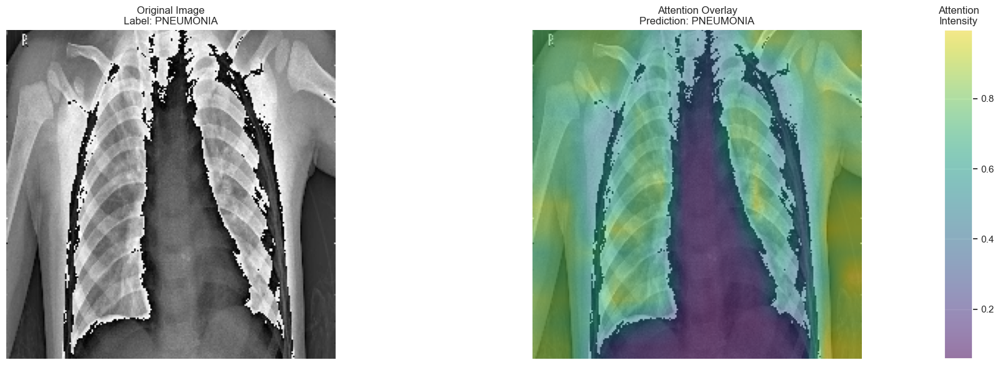

(14, 14)


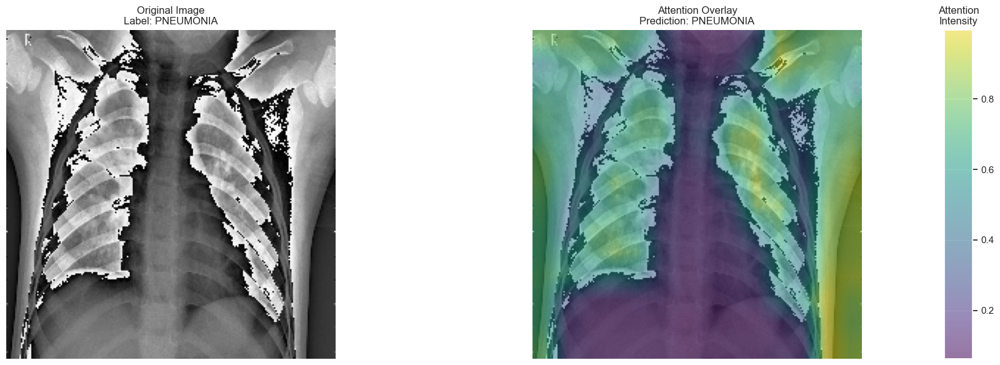

(14, 14)


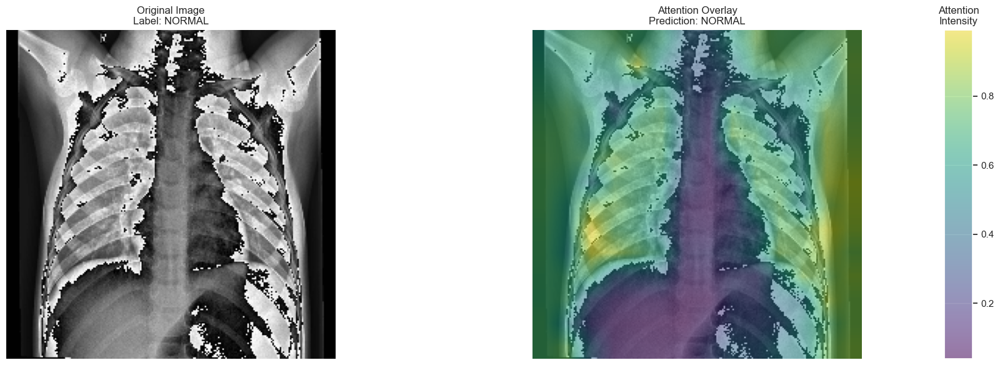

(14, 14)


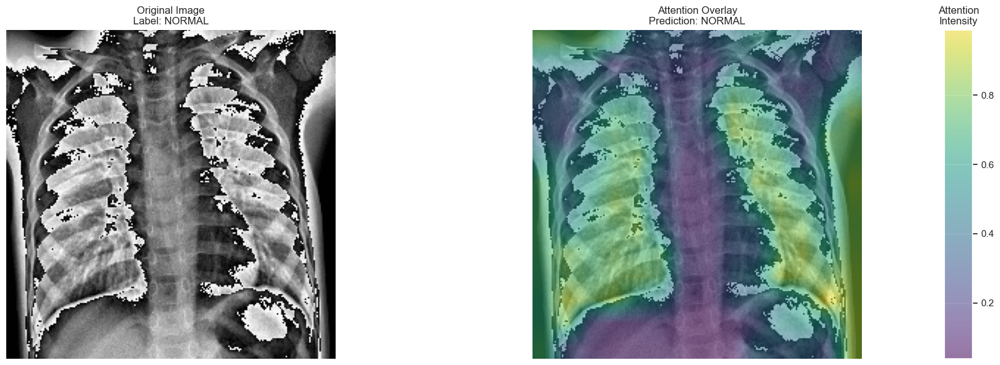

(14, 14)


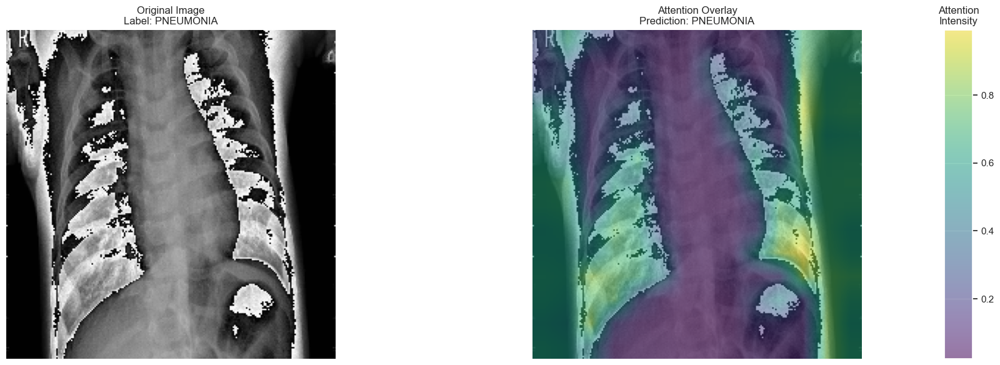

(14, 14)


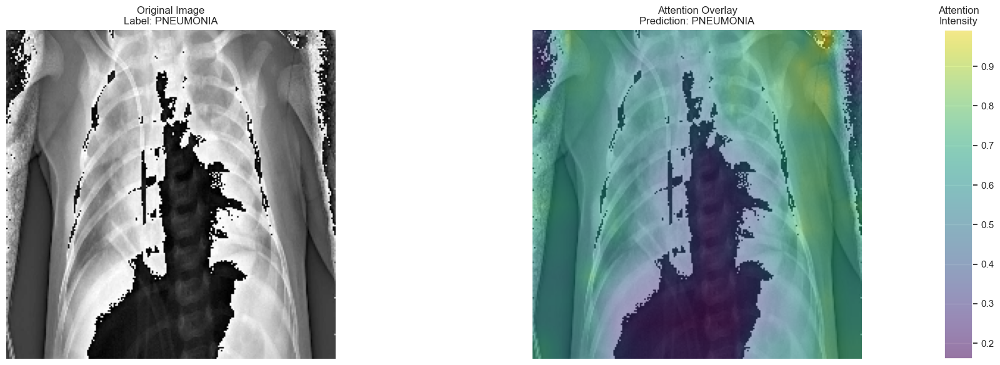

(14, 14)


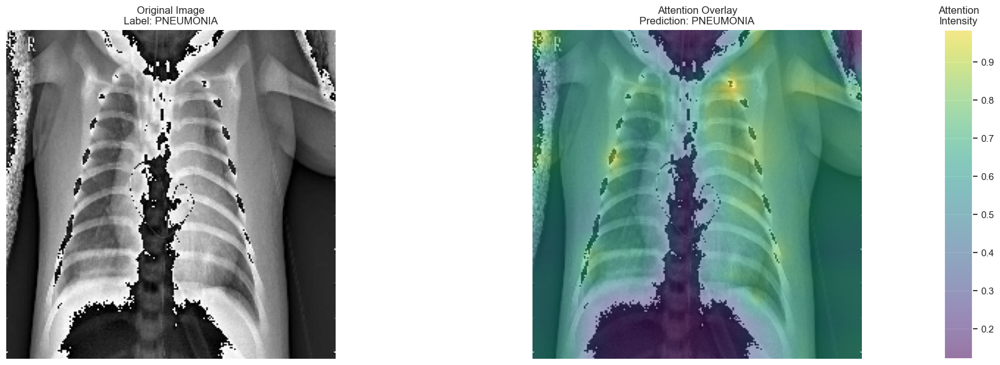

(14, 14)


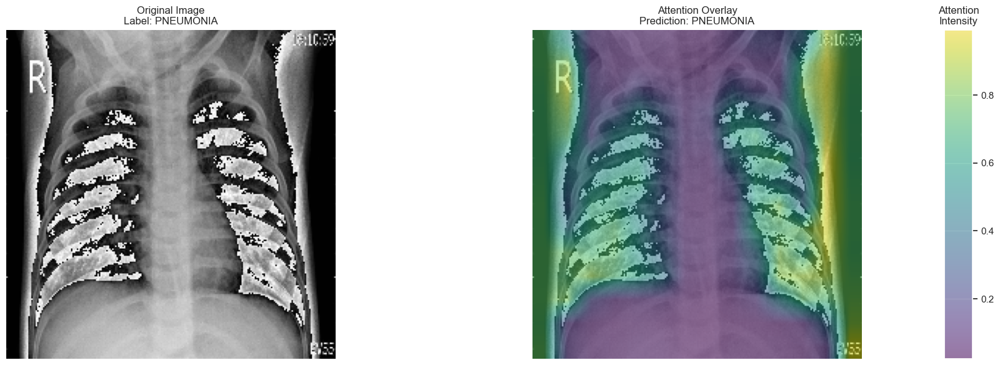

(14, 14)


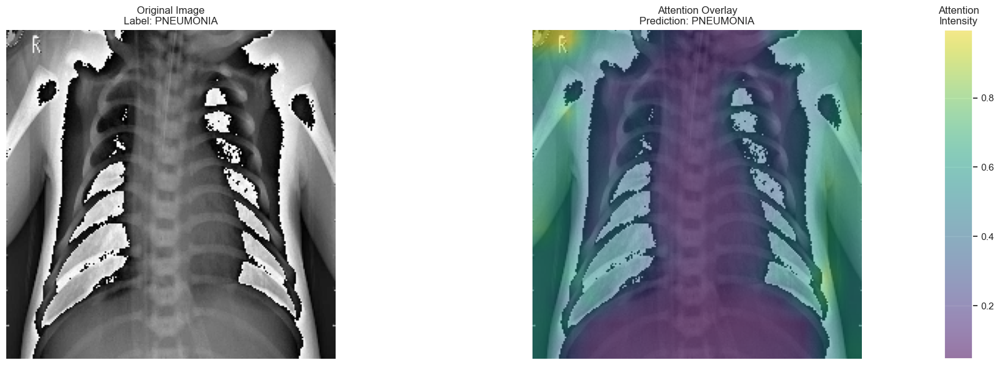

(14, 14)


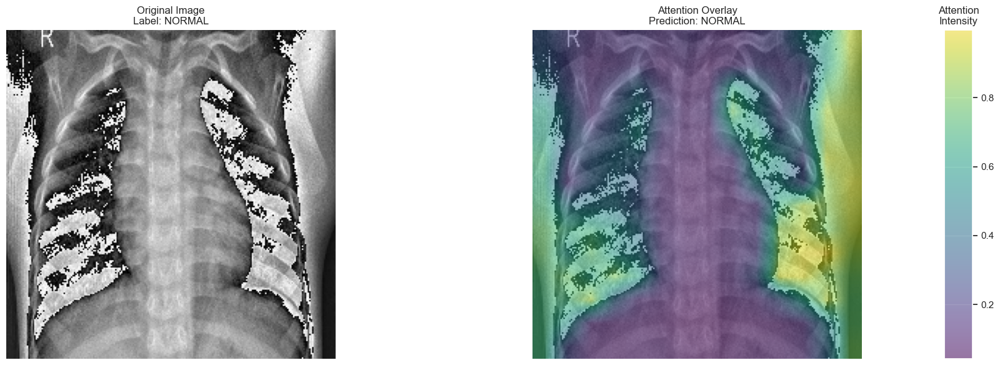

In [173]:
def compute_attention_rollout(all_attn_weights: list, head_fusion: str = "mean"):
    """
    Computes the attention rollout for a given set of attention weights.

    Implementation adapted from https://github.com/jacobgil/vit-explain/

    Args:
        all_attn_weights (List[Tensor]): A list of attention weights for each transformer block.
                                         Shape: List(Tensor(B, num_heads, n_tokens + 1, n_tokens + 1)) of length 12 for 12 blocks.
        discard_ratio (float): The ratio of attention weights to discard.
        head_fusion (str): Method to fuse attention heads ('mean', 'max', 'min').

    Returns:
        np.ndarray: The normalized attention rollout matrix reshaped to a square form, focusing on the class token.
                    Shape: (width, width), where width is the square root of (n_tokens).
    """
    result = torch.eye(all_attn_weights[0].size(-1)).to(all_attn_weights[0].device)
    with torch.no_grad():
        for attention in all_attn_weights:
            if head_fusion == "mean":
                attention_heads_fused = attention.mean(dim=1)
            elif head_fusion == "max":
                attention_heads_fused = attention.max(dim=1).values
            elif head_fusion == "min":
                attention_heads_fused = attention.min(dim=1).values
            else:
                raise ValueError("Attention head fusion type not supported")

            I = torch.eye(attention_heads_fused.size(-1), device=attention_heads_fused.device)
            a = (attention_heads_fused + I) / 2  #Regularize with the identity matrix
            a = a / a.sum(dim=-1, keepdim=True)  #Normalize
            result = torch.matmul(a, result)


    #Focus on attention between class token and image patches
    mask = result[0, 1:]  #Exclude self-attention of class token
    width = int(np.sqrt(mask.size(-1))) #sqrt(n_tokens) = 14
    mask = mask.view(width, width).cpu().numpy()
    mask = mask / np.max(mask)  # Normalize for visualization
    print(mask.shape)
    return mask


def visualize_attention(image: torch.Tensor, target: torch.Tensor, attention_rollout: np.ndarray, patch_size: int = 16):
    """
    Visualizes the original image and the image overlaid with attention rollout on a given image tensor,
    and displays a colorbar for the overlay intensity.

    Parameters:
        image (Tensor): Image of shape (3, 224, 224).
        target (Tensor): The target label of the image.
        attention_rollout (np.ndarray): The computed and normalized attention rollout matrix for the image,
                                         reshaped to a square form focusing on the class token.
                                         Shape: (width, width), where width = image_height / patch_size.
        patch_size (int): The size of the patches used by the ViT model.
    """
    img = to_pil_image(image)
    classes = ['NORMAL', 'PNEUMONIA']
    target = int(target.cpu().numpy())
    
    # Since attention_rollout is already provided in the correct shape, directly use it
    attention_map = Image.fromarray((attention_rollout * 255).astype(np.uint8))
    attention_map = attention_map.resize(img.size, resample=Image.BILINEAR)
    
    # Convert attention map back to a tensor to use PyTorch functionality for overlay
    attention_map_tensor = torch.tensor(np.array(attention_map), dtype=torch.float32) / 255

    fig, axs = plt.subplots(1, 3, figsize=(18, 6), gridspec_kw={'width_ratios': [1, 1, 0.05]})
    
    # Original image
    axs[0].imshow(img)
    axs[0].set_title(f"Original Image\nLabel: {classes[target]}")
    axs[0].axis('off')
    
    # Image with attention overlay
    axs[1].imshow(img)  # Show the image
    attention_overlay = axs[1].imshow(attention_map_tensor, cmap='viridis', alpha=0.5)  # Overlay the attention
    axs[1].set_title(f"Attention Overlay\nPrediction: {classes[target]}")
    axs[1].axis('off')

    # Colorbar for the attention intensity
    cbar = fig.colorbar(attention_overlay, cax=axs[2], orientation='vertical')
    axs[2].set_title('Attention\nIntensity')

    plt.tight_layout()
    plt.show()
    
#Comment the following out to load a previously fine-tuned model
# model = ViT(image_size=224, in_channels=3, patch_size=16, emb_dim=768, depth=12, heads=8, mlp_ratio=4.0, qkv_bias=True, drop=0.0, attn_drop=0.0, proj_drop=0.0)
# model.head = nn.Linear(model.head.in_features, 2)
# model.load_state_dict(torch.load('../pretrained_models/fine_tuned_vit.pth'))
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = model.to(device)
test_dataloader = DataLoader(test_dataset, batch_size=10, shuffle=True)
#Grab a batch of images and labels
images, labels = next(iter(test_dataloader))
images, labels = images.to(device), labels.to(device)
outputs, all_attn_weights = model(images)

for output, attn_weights, image, target in zip(outputs,all_attn_weights[0], images, labels):
    attention_rollout = compute_attention_rollout(attn_weights, head_fusion="min")
    visualize_attention(image, target, attention_rollout, patch_size=16)

Update: I noted that the above contains a small bug essential bug. Due to an indexing error, the aggregation is not performed across heads, but across the first of the two attention dimensions. The implementation below corrects for the mistake and is the proper attention rollout.

torch.Size([1, 197, 197])
(14, 14)


C:\Users\s_gue\AppData\Local\Temp\ipykernel_4472\3402085522.py:63: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  target = int(target.cpu().numpy())


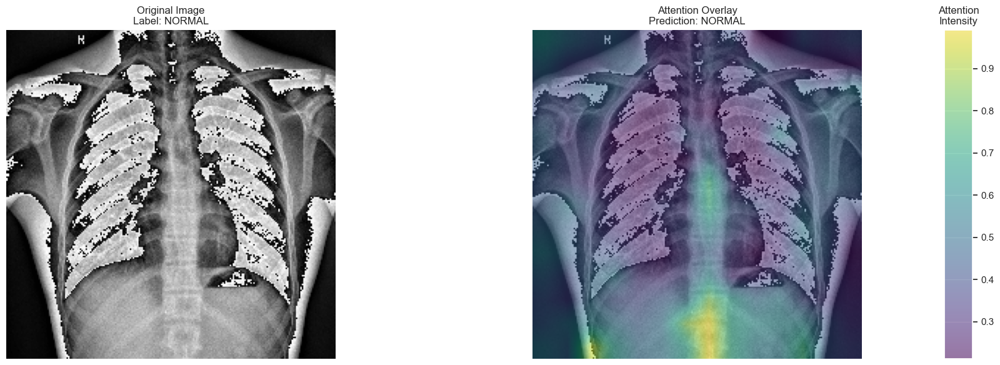

In [22]:
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=True)


def compute_attention_rollout(all_attn_weights: list, head_fusion: str = "mean"):
    """
    Computes the attention rollout for a given set of attention weights.

    Implementation adapted from https://github.com/jacobgil/vit-explain/

    Args:
        all_attn_weights (List[Tensor]): A list of attention weights for each transformer block.
                                         Shape: List(Tensor(B, num_heads, n_tokens + 1, n_tokens + 1)) of length 12 for 12 blocks.
        discard_ratio (float): The ratio of attention weights to discard.
        head_fusion (str): Method to fuse attention heads ('mean', 'max', 'min').

    Returns:
        np.ndarray: The normalized attention rollout matrix reshaped to a square form, focusing on the class token.
                    Shape: (width, width), where width is the square root of (n_tokens).
    """
    result = torch.eye(all_attn_weights[0].size(-1)).to(all_attn_weights[0].device)
    with torch.no_grad():
        for attention in all_attn_weights:
            if head_fusion == "mean":
                attention_heads_fused = attention.mean(dim=1)
            elif head_fusion == "max":
                attention_heads_fused = attention.max(dim=1).values
            elif head_fusion == "min":
                attention_heads_fused = attention.min(dim=1).values
            else:
                raise ValueError("Attention head fusion type not supported")

            I = torch.eye(attention_heads_fused.size(-1), device=attention_heads_fused.device)
            a = (attention_heads_fused + I) / 2  #Regularize with the identity matrix
            a = a / a.sum(dim=-1, keepdim=True)  #Normalize

            result = torch.matmul(a, result)

        print(result.shape)
    #Focus on attention between class token and image patches
    mask = result[0, 0, 1:]  #Exclude self-attention of class token
    width = int(np.sqrt(mask.size(-1))) #sqrt(n_tokens) = 14
    mask = mask.view(width, width).cpu().numpy()
    mask = mask / np.max(mask)  # Normalize for visualization
    print(mask.shape)
    return mask, result


def visualize_attention(image: torch.Tensor, target: torch.Tensor, attention_rollout: np.ndarray, patch_size: int = 16):
    """
    Visualizes the original image and the image overlaid with attention rollout on a given image tensor,
    and displays a colorbar for the overlay intensity.

    Parameters:
        image (Tensor): Image of shape (3, 224, 224).
        target (Tensor): The target label of the image.
        attention_rollout (np.ndarray): The computed and normalized attention rollout matrix for the image,
                                         reshaped to a square form focusing on the class token.
                                         Shape: (width, width), where width = image_height / patch_size.
        patch_size (int): The size of the patches used by the ViT model.
    """
    img = to_pil_image(image)
    classes = ['NORMAL', 'PNEUMONIA']
    target = int(target.cpu().numpy())
    
    # Since attention_rollout is already provided in the correct shape, directly use it
    attention_map = Image.fromarray((attention_rollout * 255).astype(np.uint8))
    attention_map = attention_map.resize(img.size, resample=Image.BILINEAR)
    
    # Convert attention map back to a tensor to use PyTorch functionality for overlay
    attention_map_tensor = torch.tensor(np.array(attention_map), dtype=torch.float32) / 255

    fig, axs = plt.subplots(1, 3, figsize=(18, 6), gridspec_kw={'width_ratios': [1, 1, 0.05]})
    
    # Original image
    axs[0].imshow(img)
    axs[0].set_title(f"Original Image\nLabel: {classes[target]}")
    axs[0].axis('off')
    
    # Image with attention overlay
    axs[1].imshow(img)  # Show the image
    attention_overlay = axs[1].imshow(attention_map_tensor, cmap='viridis', alpha=0.5)  # Overlay the attention
    axs[1].set_title(f"Attention Overlay\nPrediction: {classes[target]}")
    axs[1].axis('off')

    # Colorbar for the attention intensity
    cbar = fig.colorbar(attention_overlay, cax=axs[2], orientation='vertical')
    axs[2].set_title('Attention\nIntensity')

    plt.tight_layout()
    plt.show()
    
#Comment the following out to load a previously fine-tuned model
model = ViT(image_size=224, in_channels=3, patch_size=16, emb_dim=768, depth=12, heads=8, mlp_ratio=4.0, qkv_bias=True, drop=0.0, attn_drop=0.0, proj_drop=0.0)
model.head = nn.Linear(model.head.in_features, 2)
model.load_state_dict(torch.load('../pretrained_models/fine_tuned_vit.pth'))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

#Grab a batch of images and labels
image, label = next(iter(test_dataloader))
image, label = image.to(device), label.to(device)
outputs, all_attn_weights = model(image)

attention_rollout, result = compute_attention_rollout(all_attn_weights, head_fusion="max")
visualize_attention(image[0], label, attention_rollout, patch_size=16)

# References
Kermany, D. S., Goldbaum, M., Cai, W., Valentim, C. C. S., Liang, H., Baxter, S. L., McKeown, A., Yang, G., Wu, X., Yan, F., Dong, J., Prasadha, M. K., Pei, J., Ting, M. Y. L., Zhu, J., Li, C., Hewett, S., Dong, J., Ziyar, I., … Zhang, K. (2018). Identifying Medical Diagnoses and Treatable Diseases by Image-Based Deep Learning. Cell, 172(5), 1122-1131.e9. https://doi.org/10.1016/j.cell.2018.02.010

Dosovitskiy, A., Beyer, L., Kolesnikov, A., Weissenborn, D., Zhai, X., Unterthiner, T., Dehghani, M., Minderer, M., Heigold, G., Gelly, S., Uszkoreit, J., & Houlsby, N. (2021). An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale (arXiv:2010.11929). arXiv. http://arxiv.org/abs/2010.11929

Abnar, S., & Zuidema, W. (2020). Quantifying Attention Flow in Transformers. https://doi.org/10.48550/ARXIV.2005.00928